In [ ]:
'''
#UMAPload_and_plottting_v2.ipynb

Script to use UMAP dimensionality reduction, save models, and plot merged Carrasco-Godoy et al. (2024) dataset.
The user can trial binary classification with supervised learning, and edit the color map of the plots using continuous or 
categorical variables (static and plotly) before saving in a trial folder.

#Created: 20-Aug-24, Marco Acevedo
#Updated: 12-Sep-24, 17-Sep-24, 3-Oct-24, 20-Oct-25, 27-Oct-25, MA
#Updates:

#The script worked on Python 3.9.13 (clustering5), see requirements.txt
#This version follows: 'UMAP_zircongeochemistry_PCA.ipynb' and 'UMAP_zirconfertility_testing_PCA.ipynb'

Documentation list:
https://saturncloud.io/blog/jupyter-notebook-reload-module-a-comprehensive-guide/

#If still having installation issues, please, try installing:
openpyxl module
Mime type rendering requires nbformat>=4.2.0

For Laupland et al. (submitted) manuscript figures use:

UMAP_zircongeochemistry_PCA.ipynb:
umap_variables = ['P', 'Ce', 'Eu', 'Th', 'Hf', 'ppmCalc_La', 'ppmCalc_Pr', 'Imputed_Y', 'Imputed_Nd', 'Imputed_Gd', 'Imputed_Er', 'Imputed_Yb', 'Imputed_Sm', 'Imputed_Dy', 'Imputed_Lu']
same as (in old tables):
['P', 'Ce', 'Eu', 'Th', 'Hf', 'Calculated_La', 'Calculated_Pr', 'Imputed_Y', 'Imputed_Nd', 'Imputed_Gd', 'Imputed_Er', 'Imputed_Yb', 'Imputed_Sm', 'Imputed_Dy', 'Imputed_Lu']

UMAP_zirconfertility_testing_PCA.ipynb:
umap_variables = ['Eu_ratio_A', 'lambda_3', 'P', 'Dy_Yb', 'Ce_Nd', 'lambda_2', 'Eu', 'Imputed_Tb', 'Imputed_Gd', 'Gd_Yb']
same as (in old tables):
umap_variables = ['Eu/Eu*', 'λ3', 'P', 'Dy/Yb', 'Ce/Nd', 'λ2', 'Eu', 'Imputed_Tb', 'Imputed_Gd', 'Gd/Yb']

'''

# Dependencies

In [2]:
%load_ext autoreload
%autoreload 2 
#for quicker development

import os
import numpy as np
import pandas as pd

#relative path (in jupyter notebook, restart kernel after modifying functions)
from main_functions import make_dir, load_dataset_type0
from main_functions import geochemistry_calculation1, impute_REE, anenburg_lambdas, aitchison_CLR, pca_calculation
from main_functions import load_umap, umap_calculation, umap_apply, train_binary_classifier, load_wiggle, find_outliers_iqr, plot_ROC
from main_functions import define_categorical_cmap_custom, define_continuous_cmap
from main_functions import plot_umap_variable, plot_umap_variable_wiggle, plot_umap_variable_interactive 
from main_functions import plot_correlation_circle, pca_plots, plot_pca_3d_rgb, plot_pca_biplots_rgb, plot_umap_biplot_rgb, pca_to_rgb

# matplotlib widget #optional: for 3d plot
%matplotlib inline 
import umap.plot #requires datashader, holoviews
umap.plot.output_notebook() #resources= INLINE

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


e:\Feb-March_2024_zircon imaging\05_zircon geochemical data\carrasco-godoy data\clustering5\lib\site-packages\numba\np\ufunc\dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
e:\Feb-March_2024_zircon imaging\05_zircon geochemical data\carrasco-godoy data\clustering5\lib\site-packages\numba\np\ufunc\dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument types ((uint32,)). This has no effect and perhaps indicates a bug in the calling code (compiling a ufunc more than once for the same signature
  warnings.warn(msg, errors.NumbaWarning)
e:\Feb-March_2024_zircon imaging\05_zircon geochemical data\carrasco-godoy data\clustering5\lib\site-packages\numba\np\ufunc\dufunc.py:343: NumbaWarning: Compilation requested for previously compiled argument typ

Loading BokehJS ...

# Loading and filtering data

In [19]:
#User input
data_folder0 = r"E:\Feb-March_2024_zircon imaging\05_zircon geochemical data\carrasco-godoy data\Zircon_Fertility_Data-main"
file1 = "CG2024data_v5.csv" #input data
destination_directory = r"C:\Users\acevedoz\OneDrive - Queensland University of Technology\Desktop\test1"
trial_name = 'global_geochemistry_trial2' #change this name to avoid overwriting outputs
end_idx_categorical = 19 #last raw input categorical column
end_idx_numerical = 64 #last raw input numerical column

umap_variables = ['P', 'Ce', 'Eu', 'Th', 'Hf', 'ppmCalc_La', 'ppmCalc_Pr', 'Imputed_Y', 'Imputed_Nd', 'Imputed_Gd', 'Imputed_Er', 'Imputed_Yb', 'Imputed_Sm', 'Imputed_Dy', 'Imputed_Lu']
clr_choice = 'yes' #fertility: no; geochemistry: yes
standardise_choice = 'no' #fertility: yes; geochemistry: no
outliers_remove = 'no' #allows meaningful plots

model_folder = r"" #input folder
neighbors_input = 20 #default=15, preservation of local (> singletons) vs global structure
min_dist_input = 0.003 #0.003, min. dist. of packing value (in low dimensional representation)
metric_input = 'correlation'
components_output = 2 #default=2, dimensionality
variable_legend = "" #default= "" non-parametric umap; else, any categorical: "ml_classes"

type_cmap = "continuous" #categorical, continuous
variable_categorical = "ml_classes"  #"ml_classes"
variable_continuous = "P" 
percentile = 1 #capping data
n_bins = 10 #percentile bins
chosen_palette = "turbo" #"icefire", "viridis", "cubehelix", "rainbow"

add_wiggle = "yes" #or "no"; fertile=blue / barren= red background
variable_legend_ML = "ml_classes" #for binary classification: ml_classes
type_ml_model = 'svc_linear' #‘rt’, ‘rf’, ‘knn’, ‘ada_boost’, ‘svc_linear’, svc_poly’, ‘svc_rbf’, ‘neural_network’
variable_interactive = "Deposit_Batholith" #for interactive plot

#Custom UMAP plots
markerSize = 4
type_background = 'solid' #geochemistry: solid, fertility: gradient, natwani: contour

#Script begins (do not edit)

#Default
current_directory = os.getcwd() #main script location
r_script_path = os.path.join(current_directory, "script_Carrasco.R")
file4 = "standard_scaler.sav"
file5 = "umap_model.sav" 
if variable_legend:
    umap_type = "Non-parametric supervised"
else:
    umap_type = "Non-parametric unsupervised"

data_start_idx = end_idx_categorical + 4 #for interactive plot

#Generate folders
if destination_directory == "":
    data_folder2 = os.path.join(os.path.dirname(data_folder0), 'UMAP_trials', trial_name)
else:
    data_folder2 = os.path.join(destination_directory, 'UMAP_trials', trial_name)

make_dir(data_folder2)
# os.startfile(data_folder2) #open in File explorer

#Destination
if model_folder == "":
    umap_model_folder = data_folder2
    wiggle_model_folder = umap_model_folder
else:
    umap_model_folder = model_folder
    wiggle_model_folder = umap_model_folder

filepath1 = os.path.join(data_folder0, file1)
filepath4 = os.path.join(umap_model_folder, file4)
filepath5 = os.path.join(umap_model_folder, file5)

data_folder1 = data_folder2 #for intermediate processing tables

#Load data
table2 = load_dataset_type0(filepath1, end_idx_categorical, end_idx_numerical)

Geochemical calculations

In [16]:
output_Carrasco = impute_REE(table2, r_script_path, data_folder1) #time= 1m 20sec

table_input_lambdas = pd.concat([table2, output_Carrasco], axis=1) #plus Ce, Eu
output_Anenburg = anenburg_lambdas(table_input_lambdas, data_folder1) #time= 0.8 sec

output_calculations1 = geochemistry_calculation1(table_input_lambdas) #Gd/Yb, Ce/Nd, ,..

R Script Output:

R Script Error (if any):

Attaching package: 'dplyr'

The following objects are masked from 'package:stats':

    filter, lag

The following objects are masked from 'package:base':

    intersect, setdiff, setequal, union

Warning message:
In model_REE(., prefix = NULL, suffix = NULL, method = model_chosen,  :
  There are 5689 Samples with less than 3 or less elements to model, consider filtering that data, or including more elements



Dimensionality reduction (UMAP, PCA) and outlier removal

In [20]:

#Define inputs
table_input_umap = pd.concat([table2, output_Carrasco, output_Anenburg, output_calculations1], axis=1) #UMAP_zirconfertility_testing_PCA.ipynb
table_input_pca = table_input_umap

#UMAP
if model_folder == "":
    output_UMAP = umap_calculation(table_input_umap, umap_variables, variable_legend,
                                neighbors_input, min_dist_input, metric_input, components_output,
                                filepath4, filepath5, data_folder1) #time= 25 sec

    input_umap, sc, umap_model = load_umap(filepath4, filepath5, data_folder1)

else:
    input_umap, sc, umap_model = load_umap(filepath4, filepath5, data_folder1)
    output_UMAP = umap_apply(table_input_umap, umap_variables, sc, umap_model, data_folder1)

#CLR followed by PCA
table_input_pca2 = table_input_pca.loc[:, umap_variables]

if clr_choice == 'no':
    output_PCA, loadings, explained_variance_ratio = pca_calculation(table_input_pca2, standardise_choice, data_folder1) #output_CLR

elif clr_choice == 'yes':
    output_CLR = aitchison_CLR(table_input_pca2, data_folder1)
    output_PCA, loadings, explained_variance_ratio = pca_calculation(output_CLR, standardise_choice, data_folder1) #output_CLR

#Removing outlier rows (for nicer plots)
if outliers_remove == 'yes':
    
    col_names = output_PCA.columns
    idx_outliers = np.zeros((1, output_PCA.shape[0]), dtype=bool)
    for col in col_names:
        idx_temp = find_outliers_iqr(output_PCA, col)
        idx_outliers = idx_outliers | idx_temp

    output_PCA2 = output_PCA.loc[~idx_outliers, :]
    output_UMAP2 = output_UMAP.loc[~idx_outliers, :]
    table2b = table2.loc[~idx_outliers, :]

elif outliers_remove == 'no':

    output_PCA2 = output_PCA
    output_UMAP2 = output_UMAP
    table2b = table2

PCA plots


📌 PCA Loadings (First 3 PCs):
                  PC1    PC2    PC3
P_clr          -0.193 -0.221 -0.289
Ce_clr         -0.003  0.503  0.156
Eu_clr          0.096  0.191 -0.175
Th_clr         -0.059  0.490  0.565
Hf_clr         -0.166  0.242 -0.456
ppmCalc_La_clr  0.683  0.082 -0.152
ppmCalc_Pr_clr  0.400 -0.127  0.013
Imputed_Y_clr  -0.170 -0.175  0.113
Imputed_Nd_clr  0.278 -0.219  0.082
Imputed_Gd_clr -0.037 -0.253  0.155
Imputed_Er_clr -0.192 -0.161  0.111
Imputed_Yb_clr -0.221 -0.077  0.059
Imputed_Sm_clr  0.096 -0.243  0.124
Imputed_Dy_clr -0.132 -0.253  0.148
Imputed_Lu_clr -0.241  0.017  0.006
ZrSiO_clr      -0.137  0.205 -0.462


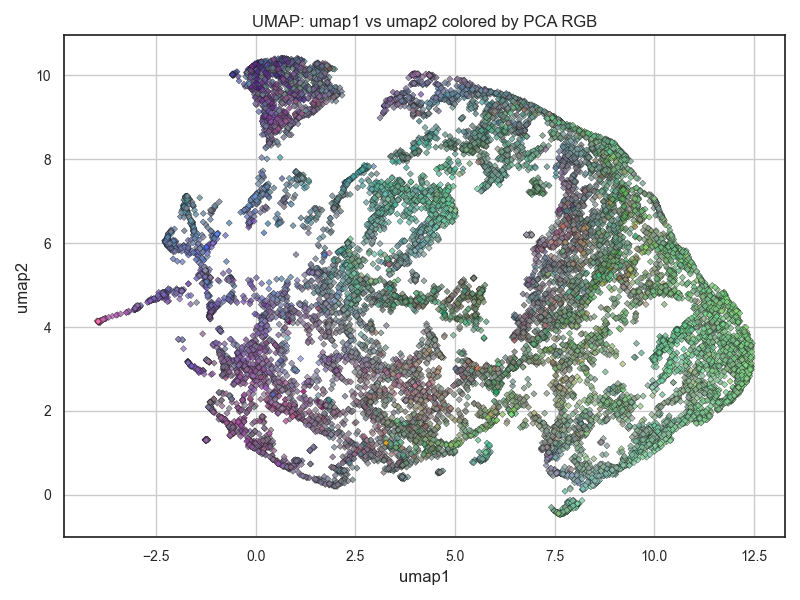

In [21]:
#Info
print("\n📌 PCA Loadings (First 3 PCs):")
print(loadings.round(3))

rgb_colors = pca_to_rgb(output_PCA2)

# pca_plots(output_PCA2, explained_variance_ratio, table2["ml_classes"]) #Scree
# plot_pca_biplots_rgb(output_PCA2, rgb_colors)
# plot_pca_3d_rgb(output_PCA2, rgb_colors)
# plot_correlation_circle(loadings[['PC1', 'PC2']], title="Correlation Circle: PC1 vs PC2")
# plot_correlation_circle(loadings[['PC1', 'PC3']], title="Correlation Circle: PC1 vs PC3")

plot_umap_biplot_rgb(output_UMAP2, 'umap1', 'umap2', rgb_colors)

UMAP plots

Model: svc_linear
Mean balanced accuracy: 0.64
Mean F1: 0.74
Mean roc_auc: 0.741


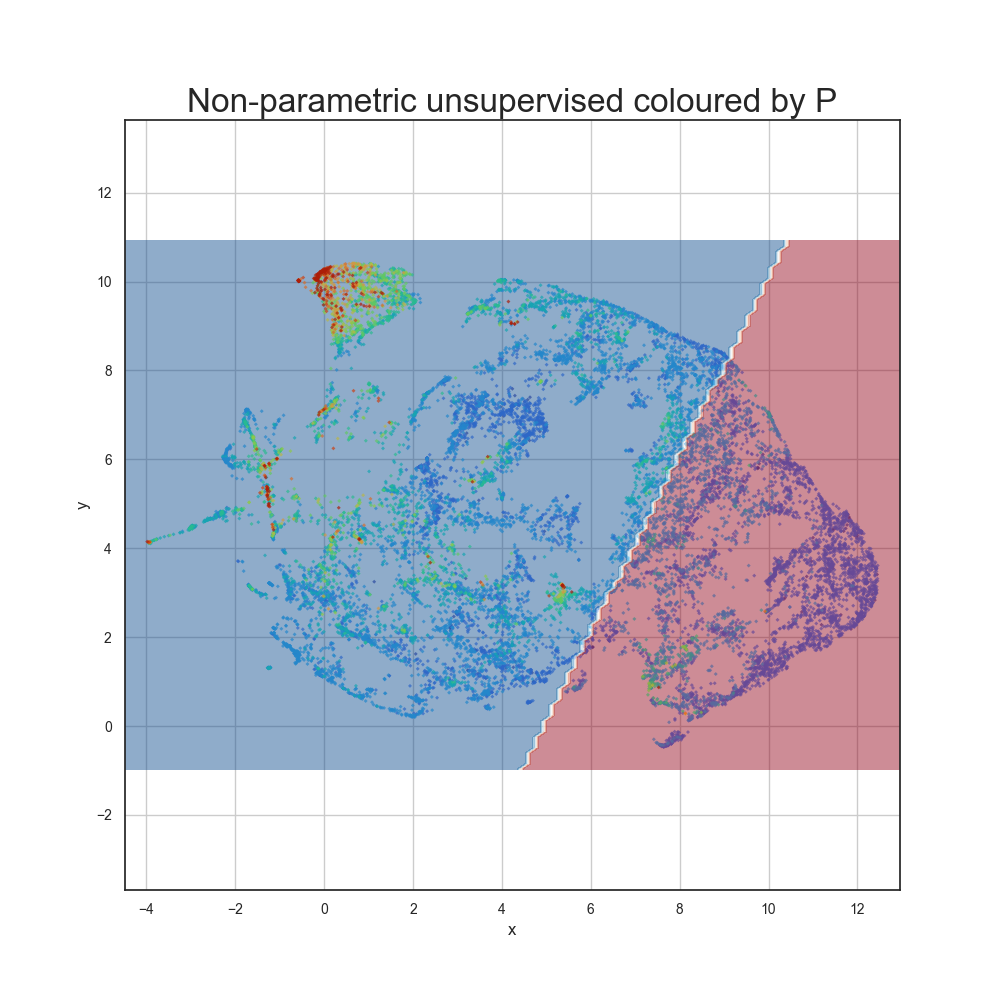

In [22]:

#Preparing data
output_UMAP3 = output_UMAP2.dropna(ignore_index=False).copy() #avoids modifying UMAP2
new_index = output_UMAP3.index

embedding2 = output_UMAP3.values
table3 = table2b.loc[new_index]

#colormap
if type_cmap == 'categorical':
    variable_legend1 = variable_categorical
    list_unique, classif, cmap_updated, cmap_updated_str = define_categorical_cmap_custom(table3, variable_categorical)
    
elif type_cmap == 'continuous':
    variable_legend1 = variable_continuous
    list_unique, classif, cmap_updated, cmap_updated_str = define_continuous_cmap(table3, variable_continuous, percentile, n_bins, chosen_palette)

title_str = f'{umap_type} coloured by {variable_legend1}'

#Static plot to understand distribution
if add_wiggle == 'no':
    plot_umap_variable(embedding2, cmap_updated, list_unique, classif, title_str, variable_legend1, markerSize, data_folder2) 
    
elif add_wiggle == 'yes':
    if model_folder == "":
        #Note: without grid search or K-fold cross-validation. Still producing good accuracy with low dimensions (2)
        fpr, tpr, verts_faces = train_binary_classifier(table3, embedding2, variable_legend_ML, type_ml_model, data_folder2)         
        # plot_ROC(fpr, tpr)
    
    X, clf = load_wiggle(wiggle_model_folder)
    plot_umap_variable_wiggle(embedding2, cmap_updated, list_unique, classif, X, clf, verts_faces,
                              title_str, type_background, variable_legend1, markerSize, data_folder2) 

#Optional: Interactive plot to find and understand points
output_UMAP3['classif'] = classif
table_interactive = table3.iloc[:, 0:data_start_idx]
table_interactive2 = pd.concat([output_UMAP3, table_interactive], axis=1) #or: table3.iloc[:, 0:data_start_idx]

plot_umap_variable_interactive(table_interactive2, cmap_updated_str, variable_interactive)

Diagnostic plots: https://umap-learn.readthedocs.io/en/latest/plotting.html

<Axes: title={'center': 'Colored by neighborhood Jaccard index'}>

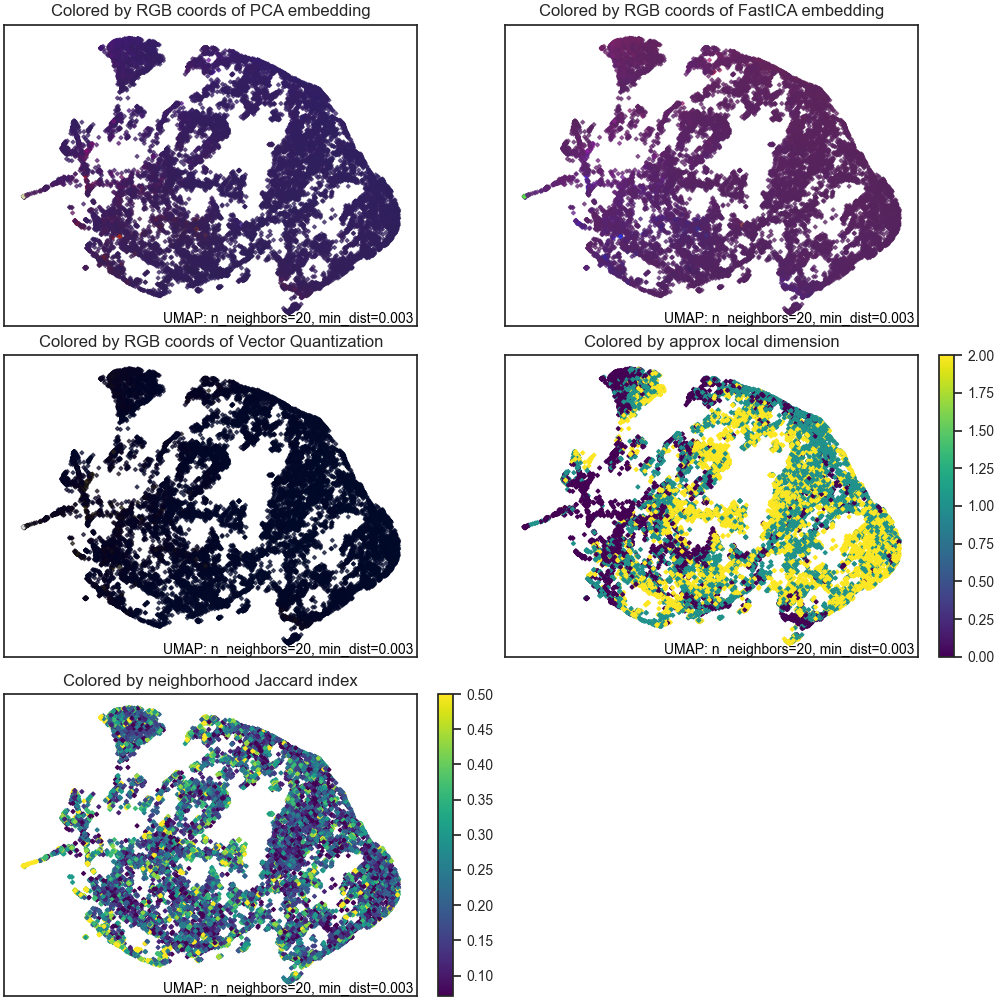

In [23]:

umap.plot.diagnostic(umap_model, diagnostic_type='all',point_size=15)

Attempt to classify points solely based on PCA coordinates

Model: svc_linear
Mean balanced accuracy: 0.77
Mean F1: 0.82
Mean roc_auc: 0.861


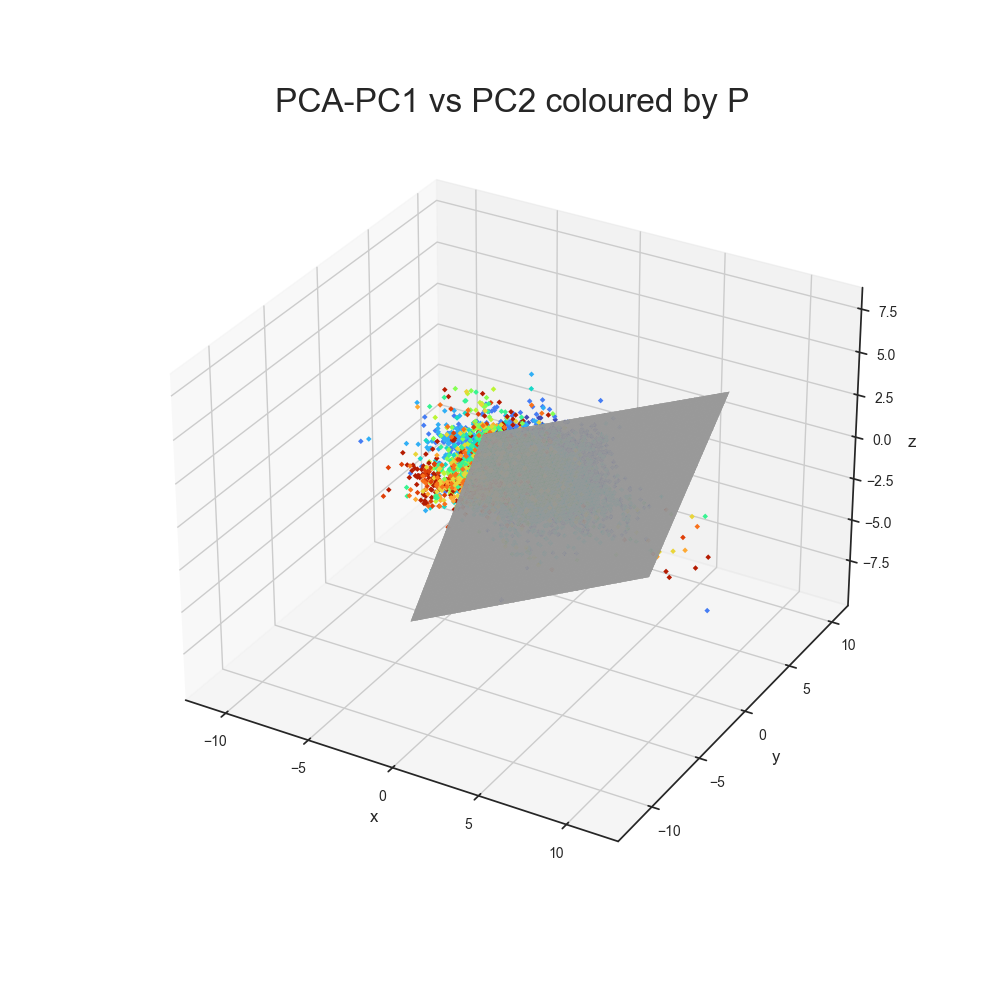

In [24]:
%matplotlib widget 
# %matplotlib notebook
#No module named 'ipympl'

# embedding3 = output_PCA2.loc[new_index, ["PC1", "PC2"]].values #for 2D plot
embedding3 = output_PCA2.loc[new_index, ["PC1", "PC2", "PC3"]].values #for 3D plot

table4 = table3

#defaults
type_background = 'solid'
markerSize = 8
title_str = f'PCA-PC1 vs PC2 coloured by {variable_legend1}'
type_ml_model = 'svc_linear' #'svc_poly'

#colormap
if type_cmap == 'categorical':
    variable_legend1 = variable_categorical
    list_unique, classif, cmap_updated, cmap_updated_str = define_categorical_cmap_custom(table4, variable_categorical)
    
elif type_cmap == 'continuous':
    variable_legend1 = variable_continuous
    list_unique, classif, cmap_updated, cmap_updated_str = define_continuous_cmap(table4, variable_continuous, percentile, n_bins, chosen_palette)
    
#Static plot to understand distribution
if add_wiggle == 'no':
    plot_umap_variable(embedding3, cmap_updated, list_unique, classif, title_str, variable_legend1, markerSize, data_folder2) 
    
elif add_wiggle == 'yes':
    if model_folder == "":
        #Note: without grid search or K-fold cross-validation. Still producing good accuracy with low dimensions (2)
        fpr, tpr, vert_faces = train_binary_classifier(table4, embedding3, variable_legend_ML, type_ml_model, data_folder2)         
        # plot_ROC(fpr, tpr)    
   
    X, clf = load_wiggle(wiggle_model_folder)
    plot_umap_variable_wiggle(embedding3, cmap_updated, list_unique, classif, X, clf, vert_faces,
                              title_str, type_background, variable_legend1, markerSize, data_folder2) 
